# Data from Tushar
## Microglia


Specific to this data:
* Two case sub conditions.
* Batch effects have been removed via LIGER.
Analysis plan:
* Compare Ctrl to each case sub condition, and compute overlap of case-specific DE genes.

In [1]:
# external dependencies
import os
import sys
notebook_path = os.path.abspath('.')
sources_path = os.path.abspath(os.path.join(notebook_path, '..'))
sys.path.insert(0, sources_path)
# import custom modules
import utils
import models
import dataloaders

# basic imports
import json
import pprint
import pickle
import logging
from tqdm.auto import tqdm, trange

# scientific python
import matplotlib.pylab as plt
import seaborn as sns
import numpy as np
import scipy as sp
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from scipy.stats import describe as describe_stats
from scipy.stats import wasserstein_distance 
RAND_SEED = 28
np.random.seed(RAND_SEED)

# Scanpy modules
import scanpy as sc
import anndata

logger = logging.getLogger()
utils.matplotlib_settings()
utils.print_module_versions([sc, anndata])

from sklearn.cluster import KMeans

scanpy    : 1.6.0
anndata   : 0.7.4


## Load the data

In [2]:
# save np.load
np_load_old = np.load
# modify the default parameters of np.load
np.load = lambda *a,**k: np_load_old(*a, allow_pickle=True, **k)

In [3]:
# puck data prefix
PREFIX = 'Tushar'
PUCK_SUBNUMBER = 'fin'
PUCK_NUMBER = f'{PUCK_SUBNUMBER}_mg'

dirname = f'latent_space_structure/data/{PREFIX}_{PUCK_NUMBER}'
metadata = pd.read_csv(f'latent_space_structure/data/{PREFIX}_{PUCK_NUMBER}/metadata.csv')#['x'].values
umap_coords = pd.read_csv(f'latent_space_structure/data/{PREFIX}_{PUCK_NUMBER}/umapcoords.csv')#['x'].values

In [4]:
meta_df = pd.merge(metadata, umap_coords, on="Unnamed: 0")

In [5]:
len(np.unique(meta_df['dataset'])) # individual id

58

In [6]:
#np.unique(meta_df['clusters'])

In [7]:
meta_df.head()

,Unnamed: 0,nUMI,nGene,dataset,percent.mito,status,clusters,sex,age,library,UMAP1,UMAP2
0,1020Y1_TCCACGTTCAGACCTA-1,11719,4440,1020,0.001195,Abeta,Myeloid_CD300E,M,64,1020Y1,-11.498776,2.584842
1,1020Y1_GATTCTTTCAAACCCA-1,11221,4152,1020,0.000980,Abeta,Microglia_GPNMB_PLAT,M,64,1020Y1,-2.631263,3.191513
2,1020Y1_TGGGAAGTCACACCCT-1,10097,4219,1020,0.001387,Abeta,Microglia_PAQR5,M,64,1020Y1,-3.374398,1.501156
3,1020Y1_CCTCATGCACTGTGTA-1,10182,4818,1020,0.004420,Abeta,Microglia_GPNMB_LPL,M,64,1020Y1,-1.216686,-5.054695
4,1020Y1_TTGCCTGAGTACTGTC-1,9737,4260,1020,0.001541,Abeta,Microglia_LYVE1_CECR2,M,64,1020Y1,1.512371,1.281989


In [8]:
#sns.scatterplot('UMAP1', 'UMAP2', hue='clusters', data=meta_df, s=6)
#plt.legend(bbox_to_anchor=(1.05, 1))

In [9]:
#sns.scatterplot('UMAP1', 'UMAP2', hue='status', data=meta_df, s=6)
#plt.legend(bbox_to_anchor=(1, 1))

In [8]:
## 'Myeloid_CD300E'
## 'Microglia_GPNMB_PLAT'
## 'Microglia_PAQR5'
## 'Microglia_GPNMB_LPL'
## 'Microglia_LYVE1_CECR2'
## 'Microglia_TNFAIP3'
## 'Microglia_FTH1_LYVE1'
## 'Microglia_CCL3'
## 'Macrophage_CD200R1'
## 'Microglia_MGAM'
## 'Microglia_GPR126_HCG22'
## 'Microglia_BRIP1'
## 'Microglia_IFIT2'

In [379]:
SUBTYPE = 'Microglia_IFIT2'
CASE_COND_OMIT = 'Abeta'
CASE_COND_KEEP = 'AbetaTau'

In [380]:
sub_df = meta_df[meta_df['clusters']==SUBTYPE]
sub_sub_df = sub_df[sub_df['status']!=CASE_COND_OMIT]

sub_sub_df['sex'] = [x[0] for x in sub_sub_df['sex']]

<ipython-input-380-c059141114f7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_sub_df['sex'] = [x[0] for x in sub_sub_df['sex']]


In [381]:
#sns.scatterplot('UMAP1', 'UMAP2', hue='status', data=sub_df, s=6)

In [382]:
#sns.scatterplot('UMAP1', 'UMAP2', hue='status', data=sub_sub_df, s=4)

In [383]:
Hnorm = pd.read_csv(f'latent_space_structure/data/{PREFIX}_{PUCK_NUMBER}/Hnormmatrix.csv')
Hnorm.drop(['Unnamed: 0'], axis=1, inplace=True)
Hnorm = Hnorm[meta_df['clusters']==SUBTYPE]
Hnorm = Hnorm[sub_df['status']!=CASE_COND_OMIT]
#Hnorm

In [384]:
output_path = f'figures/'
if not os.path.exists(output_path):
    os.mkdir(output_path)

In [385]:
def standalone_logistic(X, y):
    clf = LogisticRegression(random_state=RAND_SEED, penalty='none').fit(X, y)
    predicted_label = clf.predict(X)
    predicted_prob = clf.predict_proba(X)
    return predicted_prob[:,1]

def Hnorm_logistic_kmeans(Hnorm, num_pcs, sub_sub_df=sub_sub_df, regress_out_dataset=False):
    
    if regress_out_dataset:
        #batch_vars = np.concatenate((pd.get_dummies([x[0] for x in sub_sub_df['sex']]).values,
        #                             sub_sub_df['age'].values), axis=1)
        #X = np.concatenate((Hnorm, batch_vars), axis=1)
        #p_hat = standalone_logistic(X, sub_sub_df['status'].values)
        batch_vars = pd.get_dummies(sub_sub_df['dataset']).values
        X = np.concatenate((Hnorm, batch_vars), axis=1)
        p_hat = standalone_logistic(X, sub_sub_df['status'].values)
    else :
        p_hat = standalone_logistic(Hnorm, sub_sub_df['status'].values)
    df_p_hat = pd.DataFrame()
    df_p_hat['p_hat'] = p_hat
    df_p_hat['status'] = sub_sub_df['status'].values
    df_p_hat['dataset'] = sub_sub_df['dataset'].values
    df_p_hat['age'] = sub_sub_df['age'].values
    #adata.obs['p_hat'] = p_hat

    kmeans_case = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[(sub_sub_df['status']==CASE_COND_KEEP).values])
    kmeans_0 = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[(sub_sub_df['status']=='Ctrl').values])

    df_p_hat_clust_case = df_p_hat.copy()
    df_p_hat_clust_case['kmeans'] = '0'
    zero_lab_has_lower_mean = np.mean(p_hat[(sub_sub_df['status']==CASE_COND_KEEP).values][kmeans_case.labels_==0]) < np.mean(p_hat[(sub_sub_df['status']==CASE_COND_KEEP).values][kmeans_case.labels_==1])
    
    if np.mean(p_hat[(sub_sub_df['status']==CASE_COND_KEEP).values]) < np.mean(p_hat[(sub_sub_df['status']=='Ctrl').values]): 
        # then label KO as 0 and, when you cluster the KO
        # low p_hat for the KO should get mapped onto 0 ('KO'); high p_hat for the KO should get mapped onto 1 ('WT'-like)
        df_p_hat_clust_case['kmeans'][(sub_sub_df['status']==CASE_COND_KEEP).values] = ['0' if x==int(zero_lab_has_lower_mean) else '1' for x in kmeans_case.labels_] 
    else:
        # avg p_hat for KO is greater than avg p_hat for WT; then label KO as 1 and, when you cluster the KO
        # low p_hat for the KO should get mapped onto 0 ('WT'-like); high p_hat for the KO should get mapped onto 1 ('KO'-specific)
        print("label 1 was mapped to value 1")
        df_p_hat_clust_case['kmeans'][(sub_sub_df['status']==CASE_COND_KEEP).values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_case.labels_]
        
    np.save(f'latent_space_structure/data/{PREFIX}_{PUCK_NUMBER}/kmeans_logistic_liger{num_pcs}_cluster_{CASE_COND_KEEP}.npy', 
            df_p_hat_clust_case['kmeans'].values)
    np.save(f'latent_space_structure/data/{PREFIX}_{PUCK_NUMBER}/p_hat_logistic_liger{num_pcs}_{CASE_COND_KEEP}.npy', 
            df_p_hat_clust_case['kmeans'].values)
    print('done!') 

    #adata.obs['p_hat_clust_case'] = df_p_hat_clust_case['kmeans'].values
    sub_sub_df['p_hat_clust_case'] = df_p_hat_clust_case['kmeans'].values
    
    sub_sub_df1 = sub_sub_df[sub_sub_df['status']==CASE_COND_KEEP]
    sub_sub_df1['kmeans_case'] = kmeans_case.labels_
    
    #sns.histplot(x='p_hat', hue='dataset', multiple="stack", data=df_p_hat_clust_case, legend=False, palette='Spectral')
    #sns.histplot(x='p_hat', hue='dataset', data=df_p_hat_clust_case, legend=False)

    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(29, 8))
    sns.scatterplot(x='p_hat', y='dataset', data=df_p_hat_clust_case, palette={'Ctrl':"#1B9E77", CASE_COND_KEEP:"#D95F02"},
                         x_jitter=None, y_jitter=True, alpha=0.5, hue='status', ax=ax1)
    ax1.set_title(f'{CASE_COND_KEEP}, all cells, {num_pcs} LIGER factors'); ax1.set_xlim([0, 1])
    sns.scatterplot(x='p_hat', y='dataset', data=df_p_hat_clust_case, 
                         x_jitter=None, y_jitter=True, alpha=0.5, hue='kmeans', ax=ax2)
    ax2.set_title(f'all cells'); ax2.set_xlim([0, 1])
    sns.scatterplot(x='p_hat', y='age', data=df_p_hat_clust_case, palette={'Ctrl':"#1B9E77", CASE_COND_KEEP:"#D95F02"},
                         x_jitter=None, y_jitter=True, alpha=0.5, hue='status', ax=ax3)
    ax3.set_title(f'all cells'); ax3.set_xlim([0, 1])
    sns.scatterplot(x='p_hat', y='age', data=df_p_hat_clust_case, 
                         x_jitter=None, y_jitter=True, alpha=0.5, hue='kmeans', ax=ax4)
    ax4.set_title(f'all cells'); ax4.set_xlim([0, 1])
    plt.savefig(f'figures/scatter_p_hat_clust_case_age_dataset_liger{num_pcs}_{CASE_COND_KEEP}.png')
    plt.show()
    
    p_hat_ctrl = p_hat[(sub_sub_df['status']=='Ctrl').values]
    h_ctrl, e = np.histogram(p_hat_ctrl, bins=50, range=(0, 1))
    p = h_ctrl/p_hat_ctrl.shape[0]
    p_hat_case = p_hat[(sub_sub_df['status']==CASE_COND_KEEP).values]
    h_case, e = np.histogram(p_hat_case, bins=50, range=(0, 1))
    q = h_case/p_hat_case.shape[0]
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(29, 8))
    sns.histplot(x=p_hat, hue='status', palette={'Ctrl':"#1B9E77", CASE_COND_KEEP:"#D95F02"}, data=df_p_hat, ax=ax1)
    ax1.set_title(f'dist={wasserstein_distance(p, q)}, \n all cells, {num_pcs} LIGER factors')
    ax1.set_xlim([0, 1])
    sns.histplot(x='p_hat', hue='kmeans', data=df_p_hat_clust_case, legend=False, ax=ax2)
    ax2.set_title(f'clust {CASE_COND_KEEP}, k_means labels, all cells')
    ax2.set_xlim([0, 1])
    sns.scatterplot('UMAP1', 'UMAP2', hue='kmeans_case', data = sub_sub_df1, ax=ax3, s=6)
    ax3.set_title(f'k_means labels, {CASE_COND_KEEP} cells')
    sns.histplot(x='p_hat_clust_case', hue='sex', palette={'M':"blue", 'F':"red"}, multiple="stack", data=sub_sub_df1, ax=ax4)
    ax3.set_title(f'k_means labels, {CASE_COND_KEEP} cells')
    plt.savefig(f'figures/p_hat_clust_case_liger{num_pcs}_{CASE_COND_KEEP}.png')
    plt.show()

/opt/conda/envs/vizi/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
<ipython-input-385-3c31a2925da5>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_case['kmeans'][(sub_sub_df['status']==CASE_COND_KEEP).values] = ['0' if x==int(zero_lab_has_lower_mean) else '1' for x in kmeans_case.labels_]
<ipython-input-385-3c31a2925da5>:50: SettingWithCopy

done!


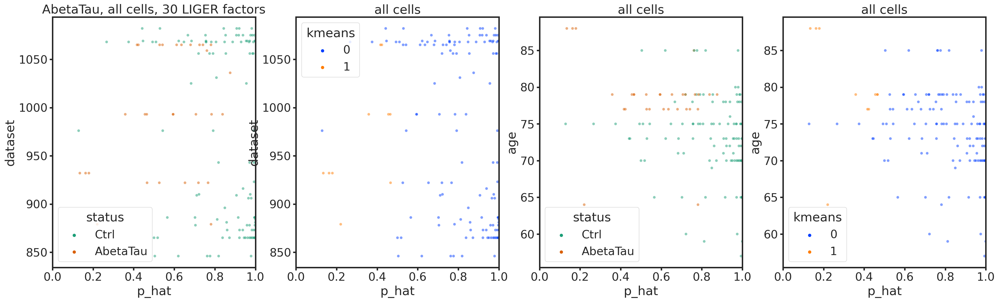

/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


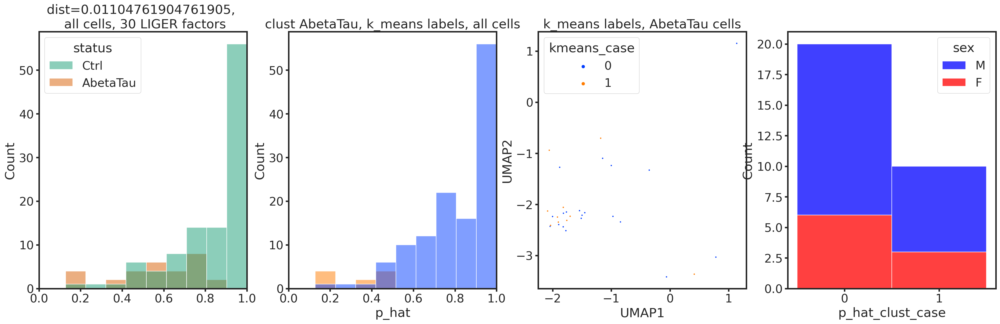

In [386]:
Hnorm_logistic_kmeans(Hnorm, num_pcs=Hnorm.shape[1])

In [387]:
#plt.scatter(p_hat, sub_sub_df['status'])

# Regress out individual

In [373]:
#Hnorm_logistic_kmeans(Hnorm, num_pcs=30, regress_out_dataset=True)

# Get p_hat for Abeta vs AbetaTau

In [374]:
CASE_COND_OMIT = 'Ctrl'
sub_sub_df = sub_df[sub_df['status']!=CASE_COND_OMIT]
sub_sub_df['sex'] = [x[0] for x in sub_sub_df['sex']]

<ipython-input-374-0a9abbb92919>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_sub_df['sex'] = [x[0] for x in sub_sub_df['sex']]


In [375]:
Hnorm = pd.read_csv(f'latent_space_structure/data/{PREFIX}_{PUCK_NUMBER}/Hnormmatrix.csv')
Hnorm.drop(['Unnamed: 0'], axis=1, inplace=True)
Hnorm = Hnorm[meta_df['clusters']==SUBTYPE]
Hnorm = Hnorm[sub_df['status']!=CASE_COND_OMIT]
#Hnorm

In [376]:
p_hat = standalone_logistic(Hnorm, sub_sub_df['status'].values)
df_p_hat = pd.DataFrame()
df_p_hat['p_hat'] = p_hat
df_p_hat['status'] = sub_sub_df['status'].values
df_p_hat['dataset'] = sub_sub_df['dataset'].values

num_pcs=Hnorm.shape[1]
np.save(f'latent_space_structure/data/{PREFIX}_{PUCK_NUMBER}/p_hat_logistic_liger{num_pcs}_Abeta_AbetaTau.npy', 
            p_hat)

/opt/conda/envs/vizi/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [377]:
p_hat_abeta = p_hat[(sub_sub_df['status']=='Abeta').values]
h_abeta, e = np.histogram(p_hat_abeta, bins=50, range=(0, 1))
p = h_abeta/p_hat_abeta.shape[0]
p_hat_abetatau = p_hat[(sub_sub_df['status']=='AbetaTau').values]
h_abetatau, e = np.histogram(p_hat_abetatau, bins=50, range=(0, 1))
q = h_abetatau/p_hat_abetatau.shape[0]

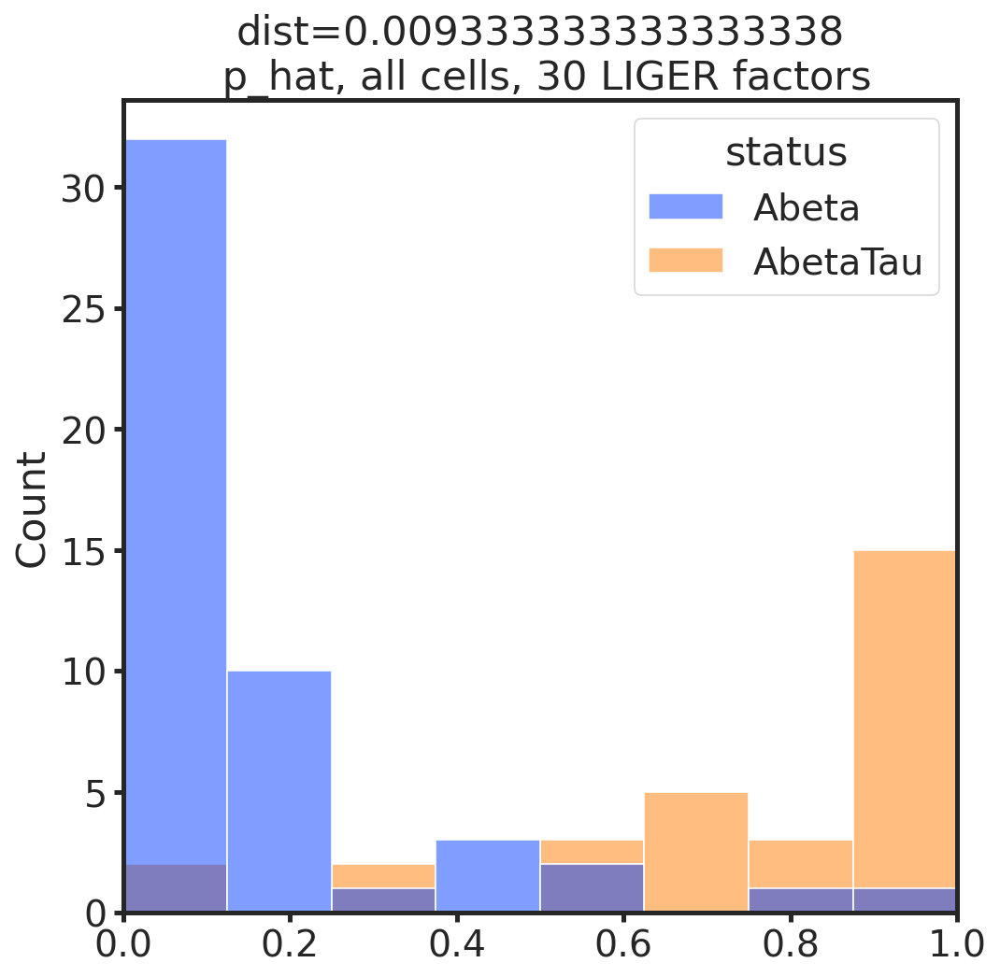

In [378]:
# plots
f, (ax1) = plt.subplots(1, 1, figsize=(8, 8))
sns.histplot(x=p_hat, hue='status', data=df_p_hat, ax=ax1)
ax1.set_title(f'dist={wasserstein_distance(p, q)}\n p_hat, all cells, {num_pcs} LIGER factors')
ax1.set_xlim([0, 1])
plt.savefig(f'figures/p_hat_hist_abeta_abetatau_liger{num_pcs}.png')
plt.show()

In [ ]:

#adata.obs['p_hat'] = p_hat

kmeans_case = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[(sub_sub_df['status']==CASE_COND_KEEP).values])
kmeans_0 = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[(sub_sub_df['status']=='Ctrl').values])

df_p_hat_clust_case = df_p_hat.copy()
df_p_hat_clust_case['kmeans'] = '0'
zero_lab_has_lower_mean = np.mean(p_hat[(sub_sub_df['status']==CASE_COND_KEEP).values][kmeans_case.labels_==0]) < np.mean(p_hat[(sub_sub_df['status']==CASE_COND_KEEP).values][kmeans_case.labels_==1])

if np.mean(p_hat[(sub_sub_df['status']==CASE_COND_KEEP).values]) < np.mean(p_hat[(sub_sub_df['status']=='Ctrl').values]): 
    # then label KO as 0 and, when you cluster the KO
    # low p_hat for the KO should get mapped onto 0 ('KO'); high p_hat for the KO should get mapped onto 1 ('WT'-like)
    df_p_hat_clust_case['kmeans'][(sub_sub_df['status']==CASE_COND_KEEP).values] = ['0' if x==int(zero_lab_has_lower_mean) else '1' for x in kmeans_case.labels_] 
else:
    # avg p_hat for KO is greater than avg p_hat for WT; then label KO as 1 and, when you cluster the KO
    # low p_hat for the KO should get mapped onto 0 ('WT'-like); high p_hat for the KO should get mapped onto 1 ('KO'-specific)
    print("label 1 was mapped to value 1")
    df_p_hat_clust_case['kmeans'][(sub_sub_df['status']==CASE_COND_KEEP).values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_case.labels_]

np.save(f'{output_path}/kmeans_logistic_pca{num_pcs}_cluster_{CASE_COND_KEEP}.npy', df_p_hat_clust_case['kmeans'].values)
print('done!') 

#adata.obs['p_hat_clust_case'] = df_p_hat_clust_case['kmeans'].values
sub_sub_df['p_hat_clust_case'] = df_p_hat_clust_case['kmeans'].values

sub_sub_df1 = sub_sub_df[sub_sub_df['status']==CASE_COND_KEEP]
sub_sub_df1['kmeans_case'] = kmeans_case.labels_
#print(sub_sub_df1)
#sub_sub_df['kmeans_case'] = kmeans_case.labels_

#print(sub_sub_df1.shape)
#print(kmeans_case.labels_.shape)

ax = sns.histplot(x='p_hat', hue='dataset', multiple="stack", data=df_p_hat_clust_case, legend=False, palette='Spectral')
plt.savefig(f'figures/p_hat_clust_case_dataset_stacked_liger{num_pcs}_{CASE_COND_KEEP}.png')
plt.show()

ax = sns.histplot(x='p_hat', hue='dataset', data=df_p_hat_clust_case, legend=False, palette='Spectral')
plt.savefig(f'figures/p_hat_clust_case_dataset_liger{num_pcs}_{CASE_COND_KEEP}.png')
plt.show()


In [4]:
adata

AnnData object with n_obs × n_vars = 1847 × 18027
    obs: 'barcodes', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'batch', 'animal_id'
    var: 'gene_ids', 'n_cells', 'mean', 'std'
    uns: 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# DE on global (original) labels

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'batch' as categorical
... storing 'animal_id' as categorical


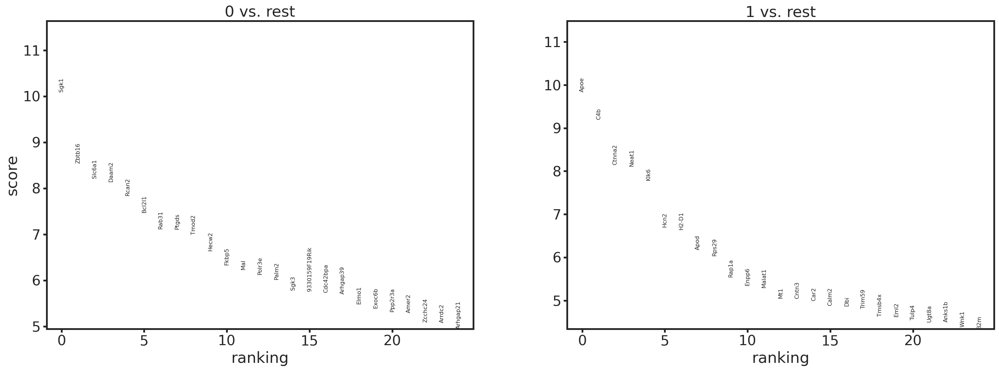

In [5]:
## classic uni-variate approach, global labels
sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [6]:
result_glob = adata.uns['rank_genes_groups']
groups_glob = result_glob['names'].dtype.names
result_glob_df = pd.DataFrame(
    {group + '_' + key[:1]: result_glob[key][group]
    for group in groups_glob for key in ['names', 'pvals_adj', 'logfoldchanges']})
result_KO_glob_df = result_glob_df[['1_n', '1_p', '1_l']]
result_WT_glob_df = result_glob_df[['0_n', '0_p', '0_l']]
#KO_glob_DEs = result_KO_glob_df.loc[result_KO_glob_df['True_p']<0.01].loc[result_KO_glob_df['True_l']>2]['True_n'].values
KO_glob_DEs = result_KO_glob_df.loc[result_KO_glob_df['1_p']<0.01].loc[result_KO_glob_df['1_l']>2]['1_n'].values
#WT_glob_DEs = result_WT_glob_df.loc[result_WT_glob_df['False_p']<0.01].loc[result_WT_glob_df['False_l']>2]['False_n'].values
WT_glob_DEs = result_WT_glob_df.loc[result_WT_glob_df['0_p']<0.01].loc[result_WT_glob_df['0_l']>2]['0_n'].values
print(KO_glob_DEs.shape, WT_glob_DEs.shape, result_glob_df.shape)

(4,) (0,) (18027, 6)


In [7]:
result_glob_df

,0_n,0_p,0_l,1_n,1_p,1_l
0,Sgk1,1.088138e-19,1.168415,Apoe,7.143325e-19,1.065938
1,Zbtb16,6.093694e-14,1.111450,C4b,2.199473e-16,4.771415
2,Slc6a1,7.522768e-13,1.121845,Ctnna2,1.034273e-12,0.857707
3,Daam2,1.034273e-12,0.716591,Neat1,1.141729e-12,0.665047
4,Rcan2,9.019367e-12,0.957342,Klk6,1.291493e-11,2.520150
...,...,...,...,...,...,...
18022,Klk6,1.291493e-11,-2.520150,Rcan2,9.019367e-12,-0.957342
18023,Neat1,1.141729e-12,-0.665047,Daam2,1.034273e-12,-0.716591
18024,Ctnna2,1.034273e-12,-0.857707,Slc6a1,7.522768e-13,-1.121845
18025,C4b,2.199473e-16,-4.771415,Zbtb16,6.093694e-14,-1.111450


In [8]:
print(KO_glob_DEs)

['C4b' 'Klk6' 'H2-D1' 'B2m']


In [9]:
print(WT_glob_DEs)

[]


/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: Futur

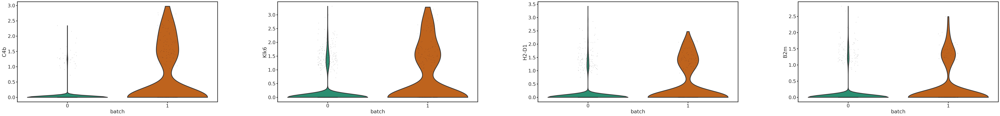

In [10]:
sc.pl.violin(adata=adata, keys=KO_glob_DEs, groupby='batch', palette=["#1B9E77", "#D95F02"])#, 
             #save=f'_{TIMEPOINT}_{SUBTYPE}_de_KO_label_KO.png')
#sc.pl.violin(adata=adata, keys=WT_glob_DEs, groupby='KO', palette=["#D95F02", "#1B9E77"], 
#             save=f'_{TIMEPOINT}_{SUBTYPE}_de_WT_label_KO.png')

In [11]:
#sc.pl.umap(adata, color='batch', palette=["#1B9E77", "#D95F02"],#, title=f'{TIMEPOINT}_{SUBTYPE}', 
#           save=f'umap_label_original.png')

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


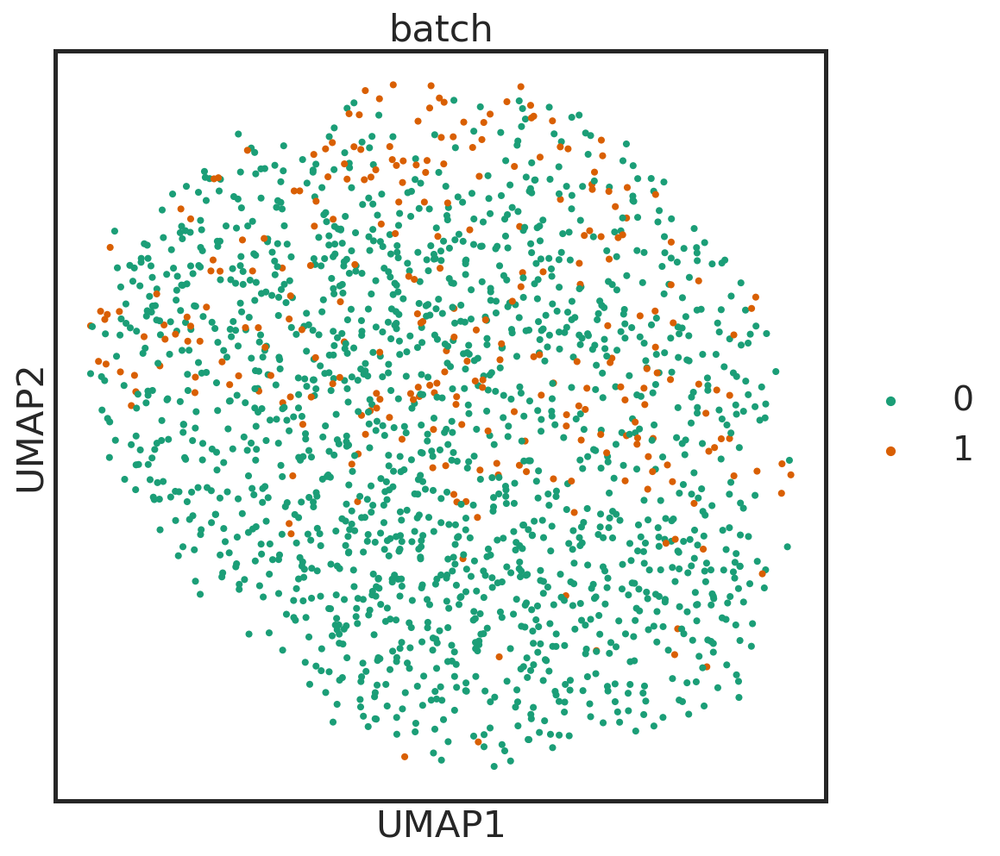

In [12]:
f, (ax1) = plt.subplots(1, 1, figsize=(8, 8))
sc.pl.umap(adata, color='batch', palette=["#1B9E77", "#D95F02"], show=False, ax=ax1)
plt.savefig(f'figures/label_original.png')
plt.show()

## Utility functions

In [13]:
output_path = f'figures/'
if not os.path.exists(output_path):
    os.mkdir(output_path)

In [14]:
def standalone_logistic(X, y):
    clf = LogisticRegression(random_state=RAND_SEED, penalty='none').fit(X, y)
    predicted_label = clf.predict(X)
    predicted_prob = clf.predict_proba(X)
    return predicted_prob[:,1]

def pca_logistic_kmeans(adata, num_pcs):
    
    p_hat = standalone_logistic(adata.obsm['X_pca'][:, 0:num_pcs], adata.obs['batch'])
    df_p_hat = pd.DataFrame()
    df_p_hat['p_hat'] = p_hat
    df_p_hat['batch'] = adata.obs['batch'].values
    adata.obs['p_hat'] = p_hat

    kmeans_1 = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[(adata.obs['batch']=='1').values])
    kmeans_0 = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[(adata.obs['batch']=='0').values])

    df_p_hat_clust_1 = df_p_hat.copy()
    df_p_hat_clust_1['kmeans'] = '0'
    zero_lab_has_lower_mean = np.mean(p_hat[(adata.obs['batch']=='1').values][kmeans_1.labels_==0]) < np.mean(p_hat[(adata.obs['batch']=='1').values][kmeans_1.labels_==1])
    
    if np.mean(p_hat[(adata.obs['batch']=='1').values]) < np.mean(p_hat[(adata.obs['batch']=='0').values]): 
        # then label KO as 0 and, when you cluster the KO
        # low p_hat for the KO should get mapped onto 0 ('KO'); high p_hat for the KO should get mapped onto 1 ('WT'-like)
        df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['0' if x==int(zero_lab_has_lower_mean) else '1' for x in kmeans_1.labels_] 
    else:
        # avg p_hat for KO is greater than avg p_hat for WT; then label KO as 1 and, when you cluster the KO
        # low p_hat for the KO should get mapped onto 0 ('WT'-like); high p_hat for the KO should get mapped onto 1 ('KO'-specific)
        print("label 1 was mapped to value 1")
        df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_1.labels_]
        
    np.save(f'{output_path}/kmeans_logistic_pca{num_pcs}_cluster_1.npy', df_p_hat_clust_1['kmeans'].values)
    print('done!') 

    adata.obs['p_hat_clust_1'] = df_p_hat_clust_1['kmeans'].values

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
    sns.histplot(x=p_hat, hue='batch', palette={'0':"#1B9E77", '1':"#D95F02"}, data=df_p_hat, ax=ax1)
    ax1.set_title(f'p_hat, all cells, {num_pcs} PCs')
    ax1.set_xlim([0, 1])
    sc.pl.umap(adata, color='p_hat', show=False, ax=ax2)
    sc.pl.umap(adata, color='p_hat_clust_1', palette=['gray', 'red'], show=False, ax=ax3)
    plt.savefig(f'figures/p_hat_clust_1_pca{num_pcs}.png')
    plt.show()

label 1 was mapped to value 1
done!


<ipython-input-14-13ada4e0fe74>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_1.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_1' as categorical


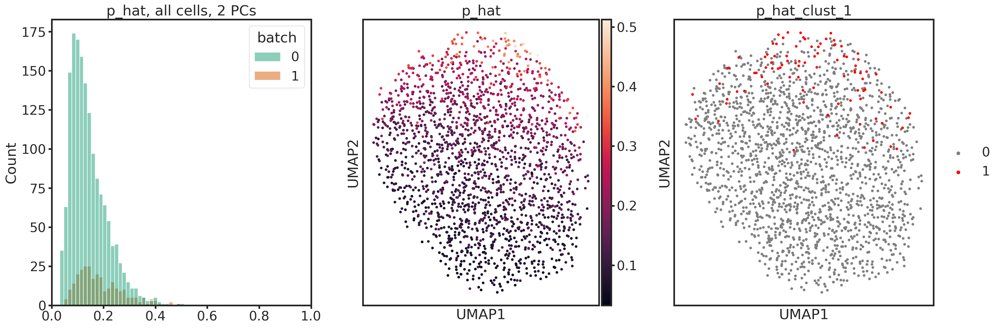

<ipython-input-14-13ada4e0fe74>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_1.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_1' as categorical


label 1 was mapped to value 1
done!


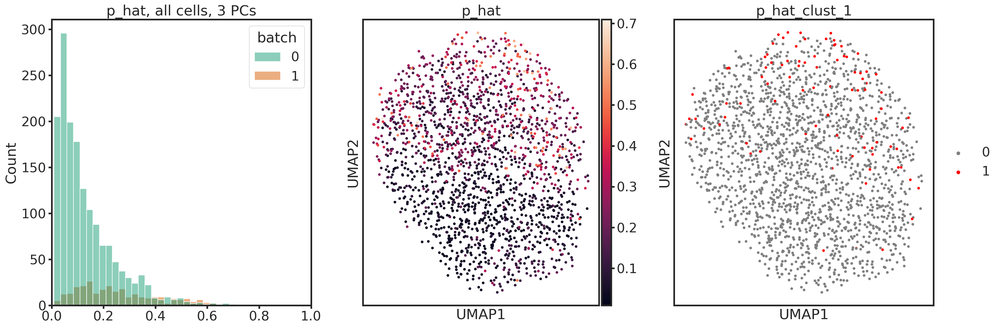

<ipython-input-14-13ada4e0fe74>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_1.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_1' as categorical


label 1 was mapped to value 1
done!


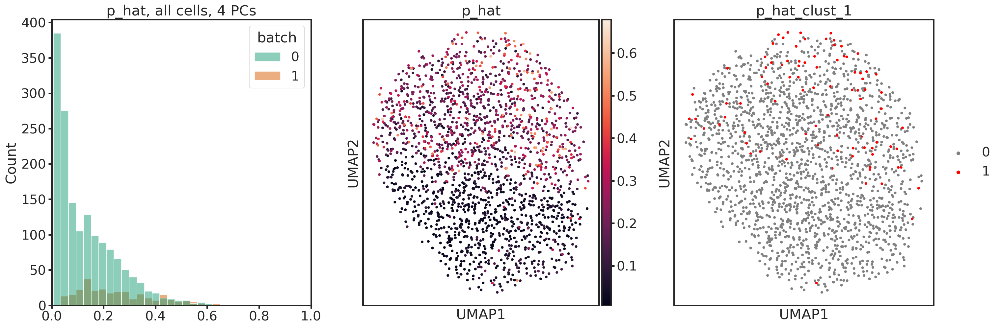

<ipython-input-14-13ada4e0fe74>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_1.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_1' as categorical


label 1 was mapped to value 1
done!


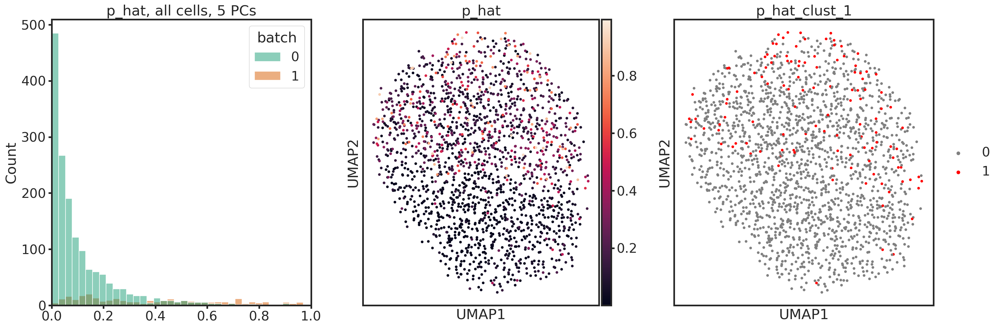

label 1 was mapped to value 1
done!


<ipython-input-14-13ada4e0fe74>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_1.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_1' as categorical


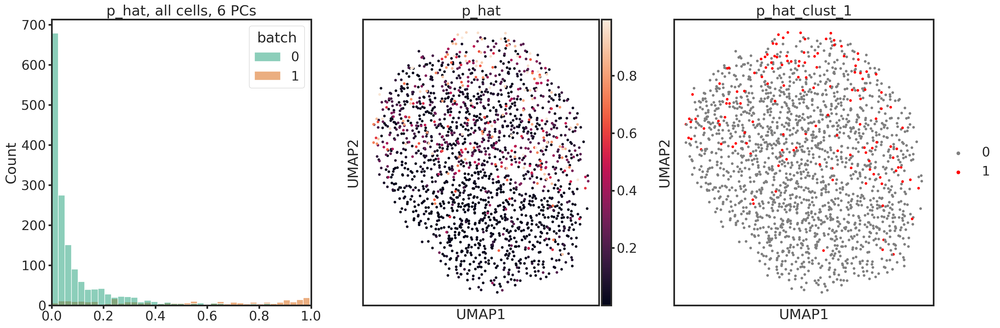

<ipython-input-14-13ada4e0fe74>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_1.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_1' as categorical


label 1 was mapped to value 1
done!


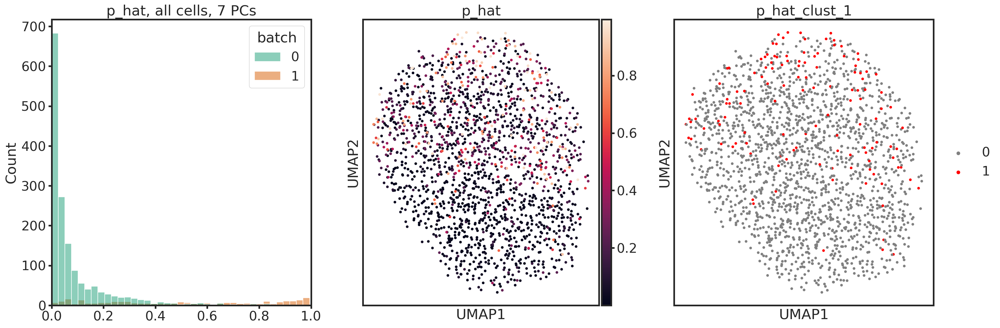

<ipython-input-14-13ada4e0fe74>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_1.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_1' as categorical


label 1 was mapped to value 1
done!


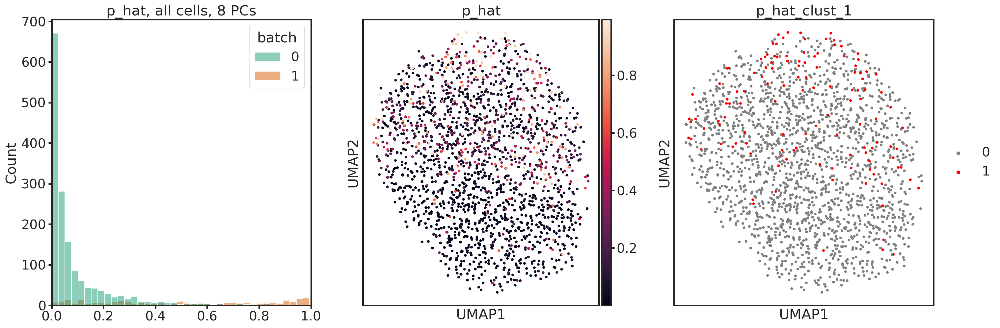

<ipython-input-14-13ada4e0fe74>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_1['kmeans'][(adata.obs['batch']=='1').values] = ['1' if x==int(zero_lab_has_lower_mean) else '0' for x in kmeans_1.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_1' as categorical


label 1 was mapped to value 1
done!


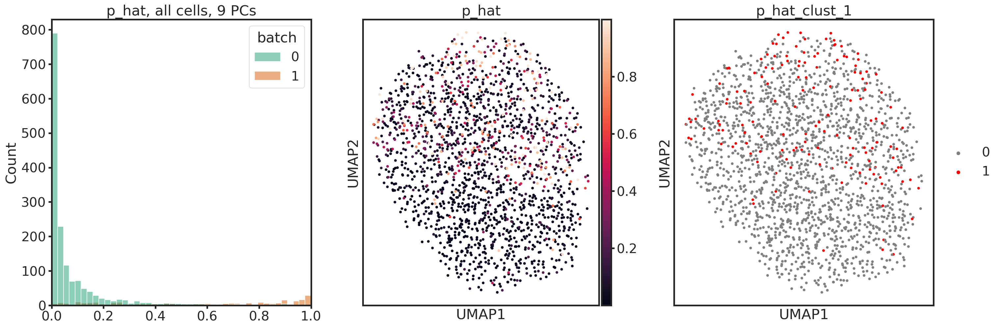

In [15]:
for num_pcs in range(2, 10):
    pca_logistic_kmeans(adata, num_pcs)

... storing 'kmeans_p_hat_2pcs' as categorical


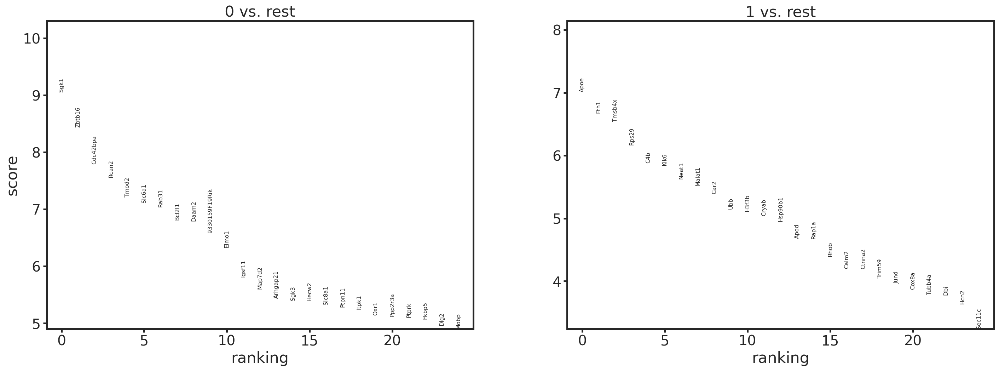

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_3pcs' as categorical


num pcs 2
(2,) (6,) (18027, 6)
['C4b' 'Klk6']
['Sgk1' 'Zbtb16' 'Slc6a1' 'Fkbp5' 'Fam214a' 'Raf1']


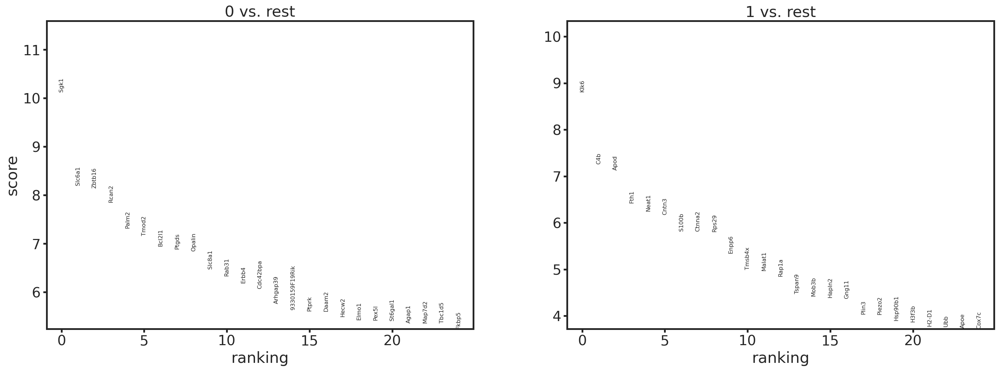

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_4pcs' as categorical


num pcs 3
(2,) (8,) (18027, 6)
['Klk6' 'C4b']
['Sgk1' 'Slc6a1' 'Zbtb16' 'Palm2' 'Ptgds' 'Opalin' 'Fkbp5' 'Nfkbia']


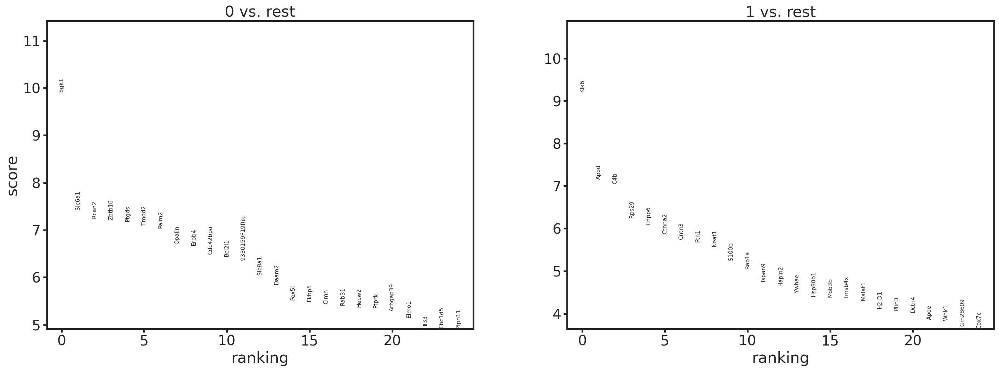

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_5pcs' as categorical


num pcs 4
(2,) (4,) (18027, 6)
['Klk6' 'C4b']
['Sgk1' 'Slc6a1' 'Ptgds' 'Fkbp5']


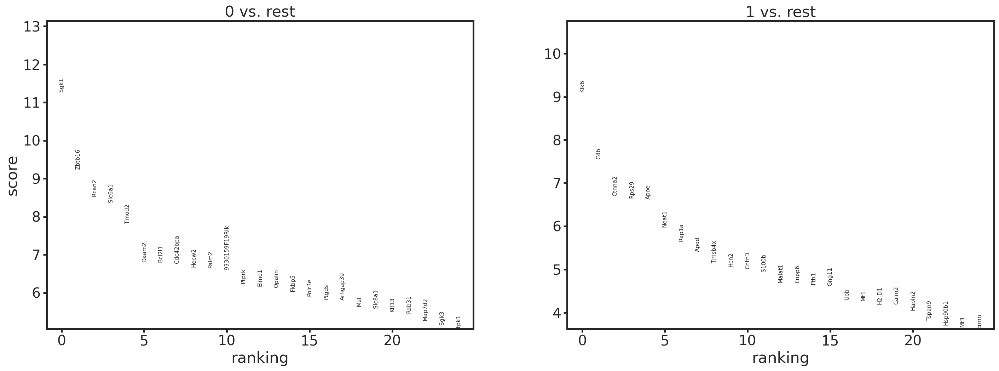

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_6pcs' as categorical


num pcs 5
(3,) (3,) (18027, 6)
['Klk6' 'C4b' 'H2-D1']
['Sgk1' 'Zbtb16' 'Fkbp5']


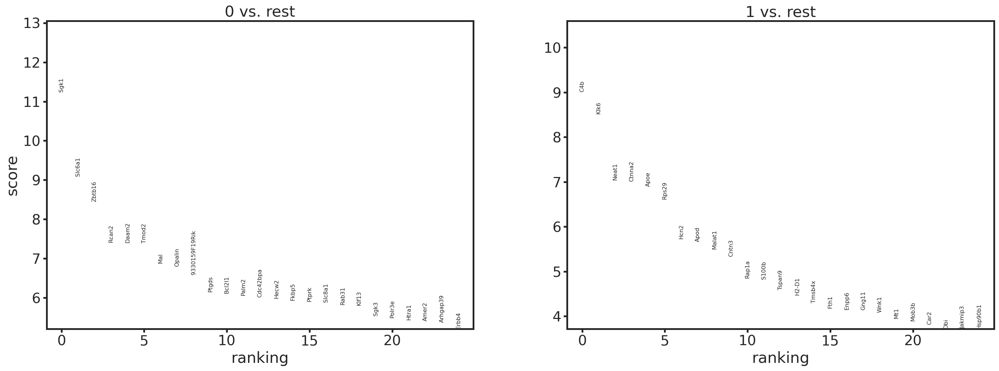

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_7pcs' as categorical


num pcs 6
(3,) (3,) (18027, 6)
['C4b' 'Klk6' 'H2-D1']
['Sgk1' 'Fkbp5' 'Arrdc2']


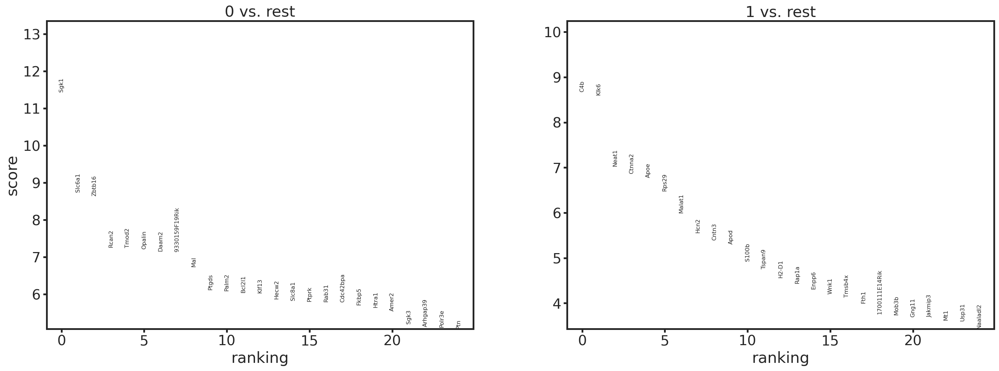

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_8pcs' as categorical


num pcs 7
(3,) (2,) (18027, 6)
['C4b' 'Klk6' 'H2-D1']
['Sgk1' 'Arrdc2']


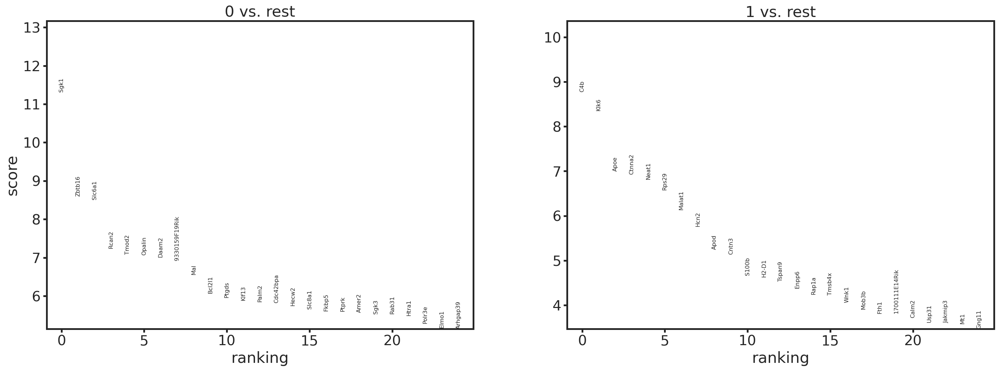

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_9pcs' as categorical


num pcs 8
(3,) (2,) (18027, 6)
['C4b' 'Klk6' 'H2-D1']
['Sgk1' 'Arrdc2']


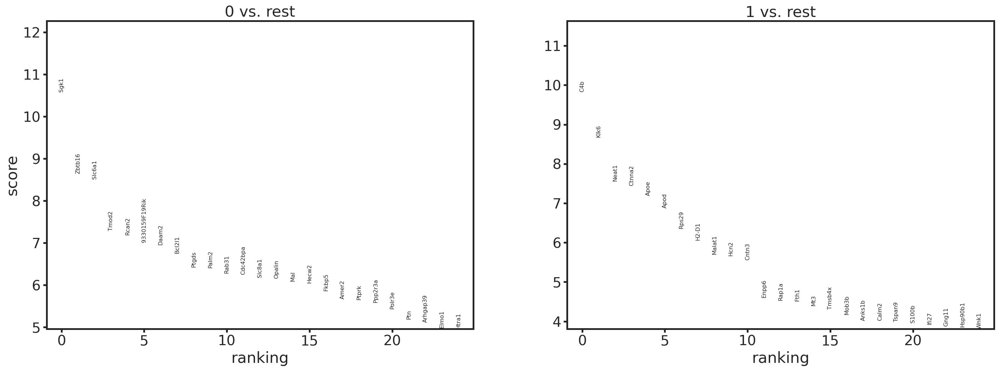

num pcs 9
(3,) (0,) (18027, 6)
['C4b' 'Klk6' 'H2-D1']
[]


In [16]:
for num_pcs in range(2, 10):
    labs = np.load(f'{output_path}/kmeans_logistic_pca{num_pcs}_cluster_1.npy')
    adata.obs[f'kmeans_p_hat_{num_pcs}pcs'] = labs.astype('str')

    sc.tl.rank_genes_groups(adata, f'kmeans_p_hat_{num_pcs}pcs', method='wilcoxon')
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    result_df = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
    result_KO_df = result_df[['1_n', '1_p', '1_l']]
    result_WT_df = result_df[['0_n', '0_p', '0_l']]
    KO_DEs = result_KO_df.loc[result_KO_df['1_p']<0.01].loc[result_KO_df['1_l']>2]['1_n'].values
    WT_DEs = result_WT_df.loc[result_WT_df['0_p']<0.01].loc[result_WT_df['0_l']>2]['0_n'].values
    print(f'num pcs {num_pcs}')
    print(KO_DEs.shape, WT_DEs.shape, result_df.shape)
    print(KO_DEs)
    print(WT_DEs)

# Compare the two subsets of KO

In [34]:
num_pcs = 4
adata1 = adata[adata.obs["batch"] == "1"]

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
Trying to set attribute `.uns` of view, copying.


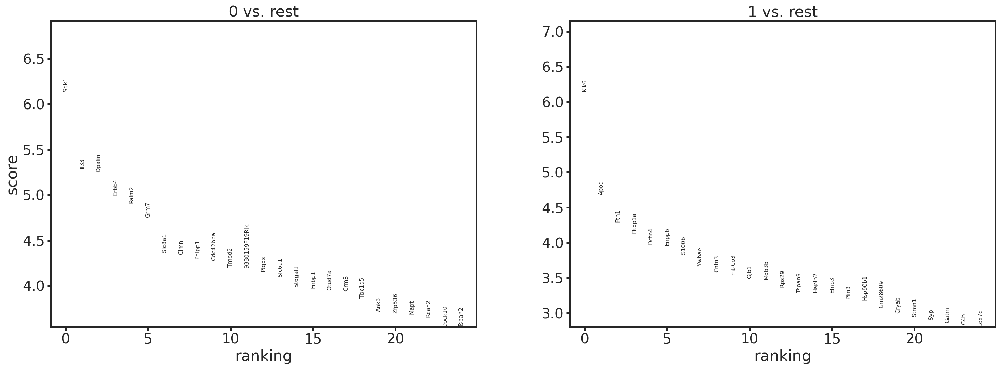

num pcs 4
(1,) (0,) (18027, 6)
['Klk6']
[]


In [35]:

sc.tl.rank_genes_groups(adata1, f'kmeans_p_hat_{num_pcs}pcs', method='wilcoxon')
sc.pl.rank_genes_groups(adata1, n_genes=25, sharey=False)

result = adata1.uns['rank_genes_groups']
groups = result['names'].dtype.names
result_df = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
result_KO_df = result_df[['1_n', '1_p', '1_l']]
result_WT_df = result_df[['0_n', '0_p', '0_l']]
KO_DEs = result_KO_df.loc[result_KO_df['1_p']<0.01].loc[result_KO_df['1_l']>2]['1_n'].values
WT_DEs = result_WT_df.loc[result_WT_df['0_p']<0.01].loc[result_WT_df['0_l']>2]['0_n'].values
print(f'num pcs {num_pcs}')
print(KO_DEs.shape, WT_DEs.shape, result_df.shape)
print(KO_DEs)
print(WT_DEs)

In [36]:
#gene_vec=['ENSMUSG00000022323.11', 'ENSMUSG00000064373.12', 'ENSMUSG00000020644.9',
#    'ENSMUSG00000047264.8', 'ENSMUSG00000004328.15', 'ENSMUSG00000047155.13']
#sc.pl.dotplot(adata1, gene_vec, f'kmeans_p_hat_{num_pcs}pcs', dendrogram=False,
#             save=f'top_des_{TIMEPOINT}_{SUBTYPE}_KO_subclustered_{num_pcs}pcs.png')

In [37]:
#sc.pl.violin(adata1, gene_vec, groupby='sample_name',
#             save=f'top_des_sample_name_{TIMEPOINT}_{SUBTYPE}_KO_subclustered_{num_pcs}pcs.png')

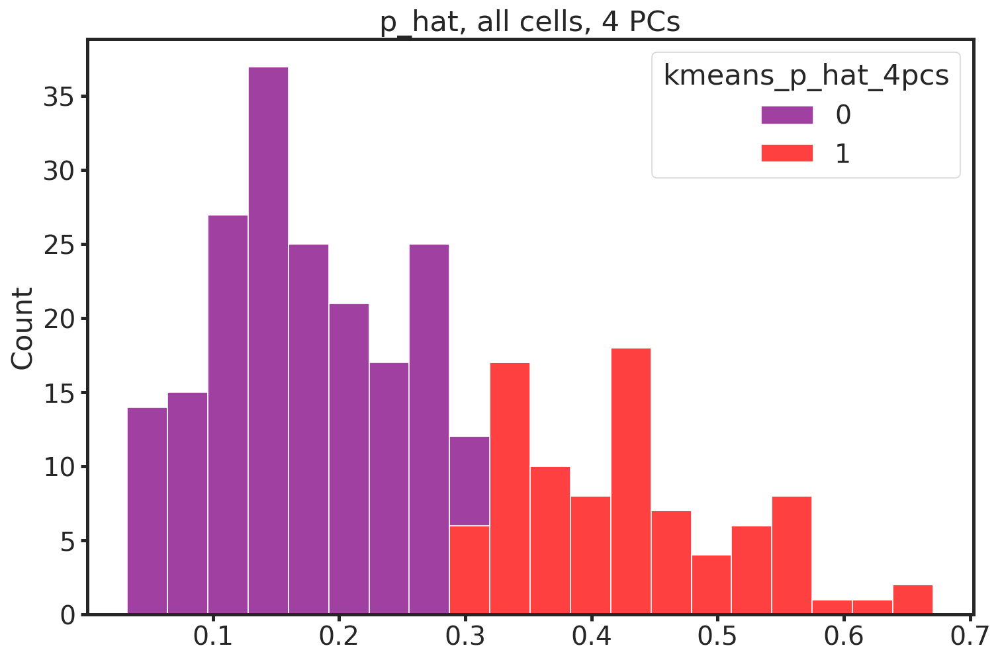

In [38]:
p_hat = standalone_logistic(adata.obsm['X_pca'][:, 0:num_pcs], adata.obs['batch'])[adata.obs["batch"] == "1"]
df_p_hat = pd.DataFrame()
df_p_hat['p_hat'] = p_hat
df_p_hat[f'kmeans_p_hat_{num_pcs}pcs'] = adata1.obs[f'kmeans_p_hat_{num_pcs}pcs'].values
sns.histplot(x=p_hat, hue=f'kmeans_p_hat_{num_pcs}pcs', 
             palette={'0':"purple", '1':"red"},
             multiple="stack", bins=20,
             data=df_p_hat)
plt.title(f'p_hat, all cells, {num_pcs} PCs')
plt.savefig(f'figures/hist_p_hat_1_subclustered_pca{num_pcs}.png')
plt.show()

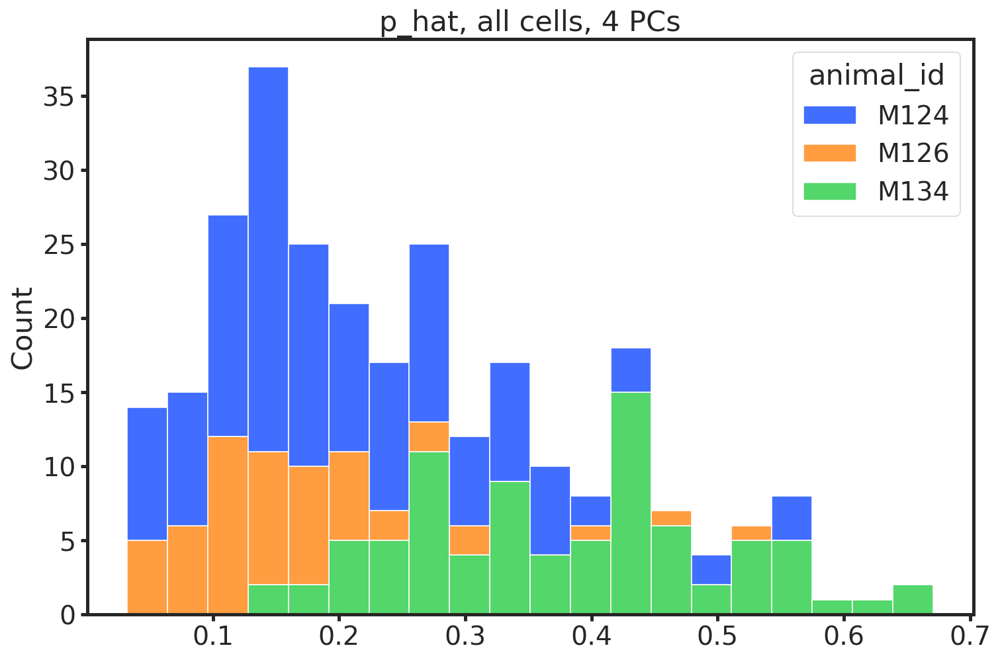

In [39]:
df_p_hat = pd.DataFrame()
df_p_hat['p_hat'] = p_hat
df_p_hat['animal_id'] = adata1.obs['animal_id'].values
sns.histplot(x=p_hat, hue='animal_id',
             multiple="stack", bins=20,
             data=df_p_hat)
plt.title(f'p_hat, all cells, {num_pcs} PCs')
plt.savefig(f'figures/hist_p_hat_sample_name_KO_pca{num_pcs}.png')
plt.show()

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


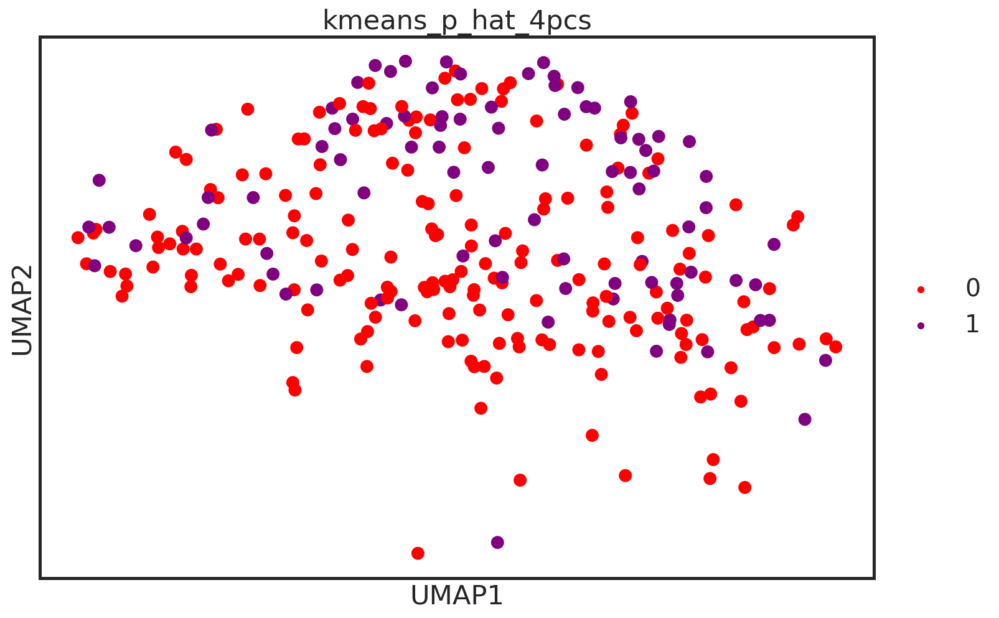

In [40]:
sc.pl.umap(adata1, color=f'kmeans_p_hat_{num_pcs}pcs', palette=["red", "purple"],
           save=f'_female_subclustered_{num_pcs}pcs.png')

In [41]:
## baseline0: seurat cluster all cells into two clusters
#adata.obs['baseline0'] = seurat_labs.astype('str')

## classic uni-variate approach, global labels
#sc.tl.rank_genes_groups(adata, 'baseline0', method='wilcoxon')
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

#result_baseline0 = adata.uns['rank_genes_groups']
#groups_baseline0 = result_glob['names'].dtype.names
#result_baseline0_df = pd.DataFrame(
#    {group + '_' + key[:1]: result_baseline0[key][group]
#    for group in groups_baseline0 for key in ['names', 'pvals_adj', 'logfoldchanges']})
#result_1_baseline0_df = result_baseline0_df[['1_n', '1_p', '1_l']]
#result_0_baseline0_df = result_baseline0_df[['0_n', '0_p', '0_l']]
#lab0_baseline0_DEs = result_0_baseline0_df.loc[result_0_baseline0_df['0_p']<0.01].loc[result_0_baseline0_df['0_l']>0.25]['0_n'].values
#lab1_baseline0_DEs = result_1_baseline0_df.loc[result_1_baseline0_df['1_p']<0.01].loc[result_1_baseline0_df['1_l']>0.25]['1_n'].values
#print(lab0_baseline0_DEs.shape, lab1_baseline0_DEs.shape, result_baseline0_df.shape)

... storing 'kmeans_p_hat_2pcs' as categorical


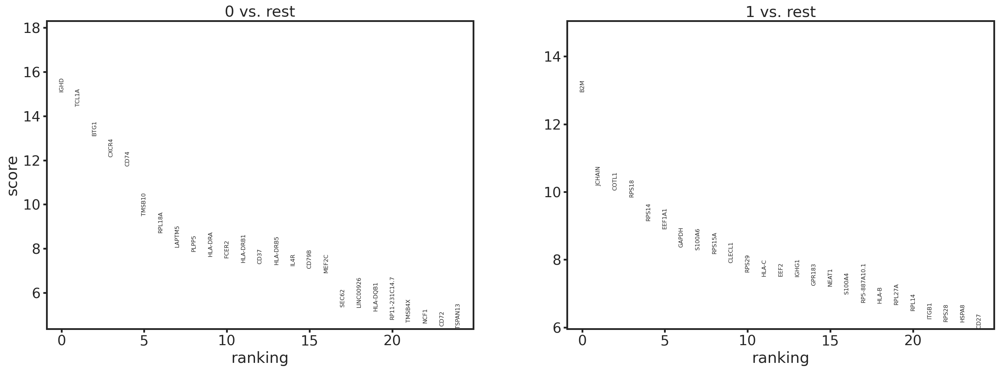

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_3pcs' as categorical


num pcs 2
(11,) (5,) (17009, 6)
['JCHAIN' 'CLECL1' 'IGHG1' 'GPR183' 'RP5-887A10.1' 'ITGB1' 'CD27'
 'TNFRSF13B' 'CRIP1' 'ANXA2' 'AL928768.3']
['IGHD' 'TCL1A' 'PLPP5' 'FCER2' 'IL4R']


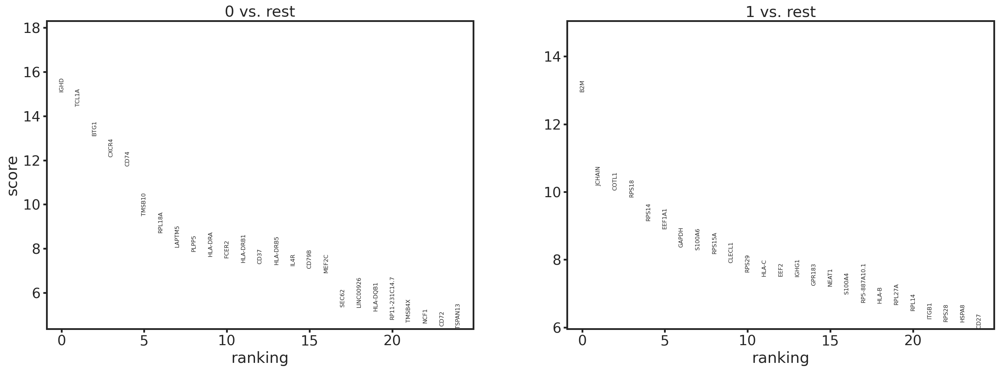

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_4pcs' as categorical


num pcs 3
(11,) (5,) (17009, 6)
['JCHAIN' 'CLECL1' 'IGHG1' 'GPR183' 'RP5-887A10.1' 'ITGB1' 'CD27'
 'TNFRSF13B' 'CRIP1' 'ANXA2' 'AL928768.3']
['IGHD' 'TCL1A' 'PLPP5' 'FCER2' 'IL4R']


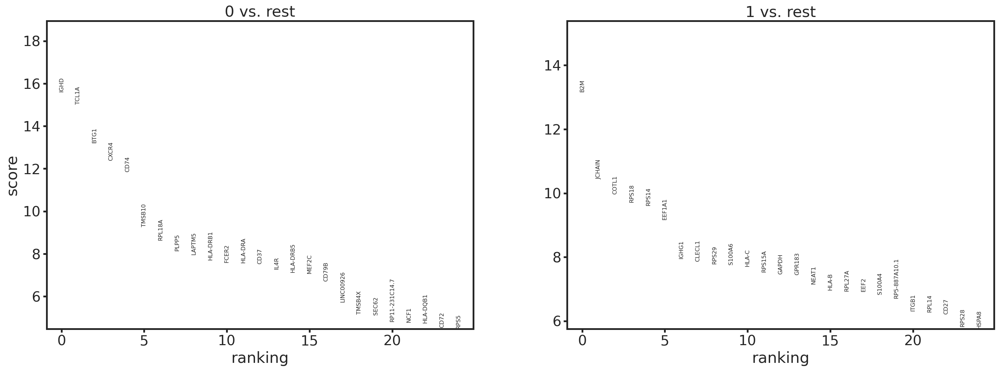

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_5pcs' as categorical


num pcs 4
(12,) (6,) (17009, 6)
['JCHAIN' 'IGHG1' 'CLECL1' 'GPR183' 'RP5-887A10.1' 'ITGB1' 'CD27' 'LGALS1'
 'TNFRSF13B' 'ANXA2' 'CRIP1' 'AL928768.3']
['IGHD' 'TCL1A' 'PLPP5' 'FCER2' 'IL4R' 'YBX3']


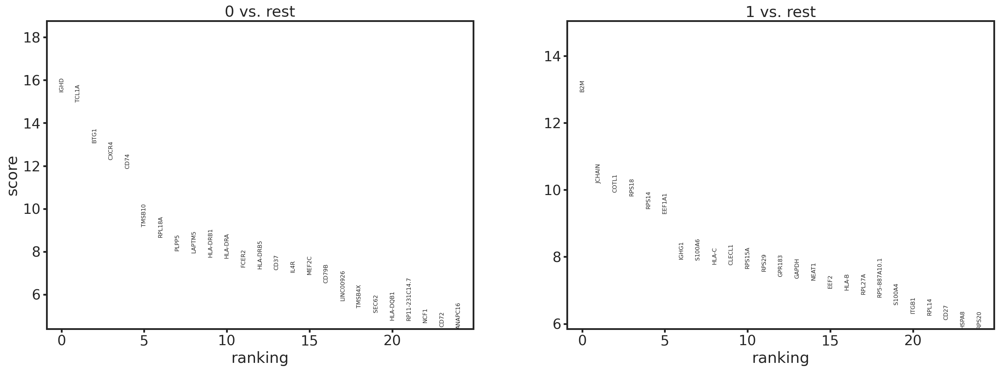

num pcs 5
(11,) (5,) (17009, 6)
['JCHAIN' 'IGHG1' 'CLECL1' 'GPR183' 'RP5-887A10.1' 'ITGB1' 'CD27'
 'TNFRSF13B' 'ANXA2' 'CRIP1' 'AL928768.3']
['IGHD' 'TCL1A' 'PLPP5' 'IL4R' 'YBX3']


In [ ]:
# if you find something, check for batch effects

In [ ]:
labs = np.load(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca.npy')

In [ ]:
labs

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'baseline1' as categorical


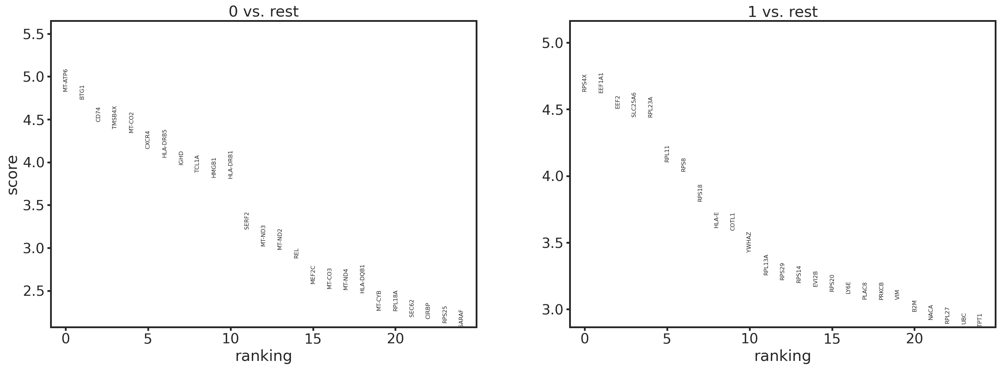

(0,) (0,) (17009, 6)


In [952]:
# baseline1: kmeans on p_hat for case from logistic on pca
labs = np.load(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca.npy')
adata.obs['baseline1'] = labs.astype('str')

# classic uni-variate approach, global labels
sc.tl.rank_genes_groups(adata, 'baseline1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

result_baseline1 = adata.uns['rank_genes_groups']
groups_baseline1 = result_glob['names'].dtype.names
result_baseline1_df = pd.DataFrame(
    {group + '_' + key[:1]: result_baseline1[key][group]
    for group in groups_baseline1 for key in ['names', 'pvals_adj', 'logfoldchanges']})
result_case_baseline1_df = result_baseline1_df[['1_n', '1_p', '1_l']]
result_control_baseline1_df = result_baseline1_df[['0_n', '0_p', '0_l']]
control_baseline1_DEs = result_control_baseline1_df.loc[result_control_baseline1_df['0_p']<0.01].loc[result_control_baseline1_df['0_l']>0.25]['0_n'].values
case_baseline1_DEs = result_case_baseline1_df.loc[result_case_baseline1_df['1_p']<0.01].loc[result_case_baseline1_df['1_l']>0.25]['1_n'].values
print(control_baseline1_DEs.shape, case_baseline1_DEs.shape, result_baseline1_df.shape)

## Save DEs

In [953]:
#fname = f'latent_space_structure/data/{PUCK_NUMBER}/DE_results.npz'
#adict = {'memory_DEs':memory_DEs, 
#         'naive_DEs':naive_DEs,
#         'control_DEs':control_glob_DEs,
#         'case_DEs':case_glob_DEs,
#         'naiveB_control_DEs':naiveB_0_DEs,
#         'naiveB_case_DEs':naiveB_1_DEs}
#np.savez_compressed(fname, **adict)
##np.savez_compressed(fname, memory_DEs=memory_DEs, naive_DEs=naive_DEs)

## Save baseline0

In [954]:
fname = f'latent_space_structure/data/{PUCK_NUMBER}/DE_baseline0_results.npz'
adict = {'memory_DEs':memory_DEs, 
         'naive_DEs':naive_DEs,
         'lab0_baseline0_DEs':lab0_baseline0_DEs,
         'lab1_baseline0_DEs':lab1_baseline0_DEs}
np.savez_compressed(fname, **adict)
#adict

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


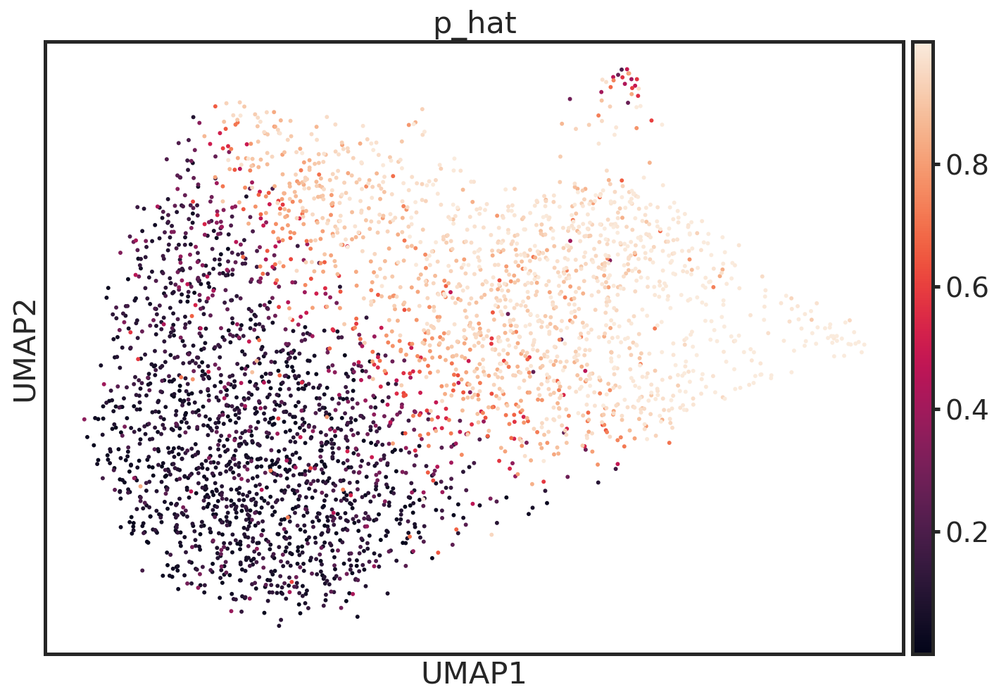

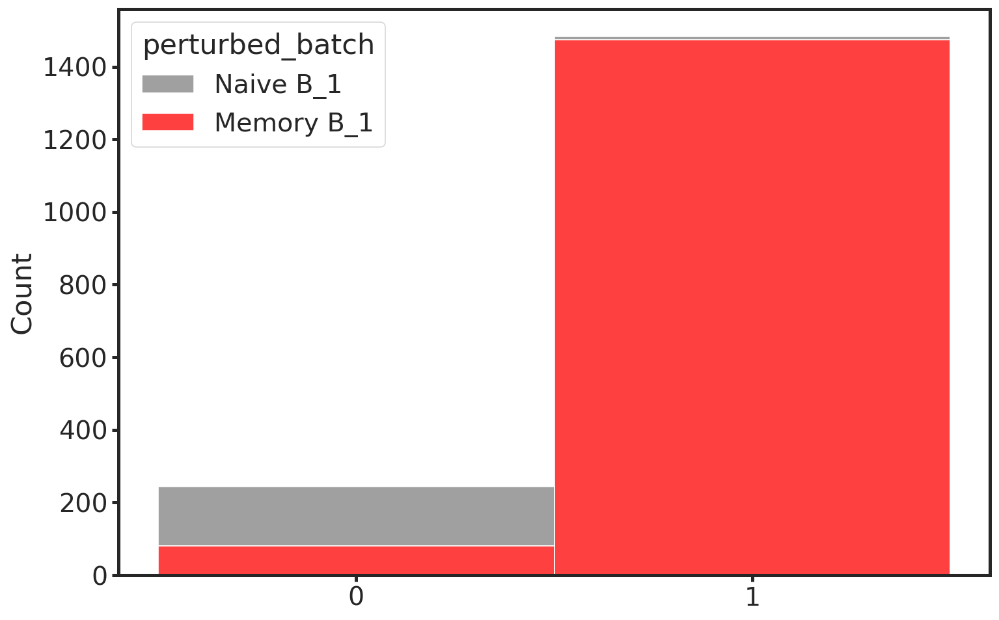

In [176]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[batch==1])#(df.drop(['batch', 'perturbed'], axis=1))
kmeans.labels_
#kmeans.cluster_centers_

df = pd.DataFrame()
df['batch'] = adata.obs['batch'].values.astype(int)
df['perturbed'] = adata.obs['perturbed'].values
df_kmeans = df[batch==1].copy()
df_kmeans['perturbed_batch'] = df_kmeans.apply(lambda row: f'{row["perturbed"]}_{row["batch"]}', axis=1)
df_kmeans['kmeans_labels'] = kmeans.labels_
#df_kmeans.head()
sns.histplot(x=kmeans.labels_.astype('str'), 
             hue='perturbed_batch', 
             palette=['gray', 'red'],#sns.color_palette('Dark2', 2), 
             multiple='stack', 
             data=df_kmeans)
plt.show()

In [177]:
kmeans.cluster_centers_
# can try a gaussian mixture too
# maybe LDA also?

array([[0.22663035],
       [0.9180321 ]])

<ipython-input-178-be6db1941019>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat['kmeans'][batch==1] = kmeans.labels_


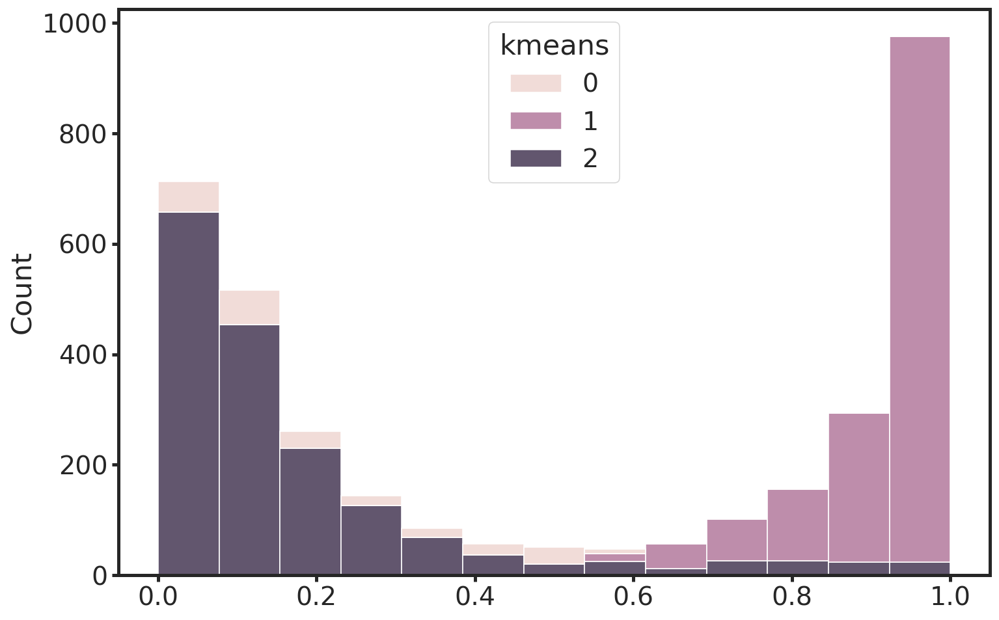

In [178]:
df_p_hat['kmeans'] = 2
df_p_hat['kmeans'][batch==1] = kmeans.labels_
sns.histplot(x=p_hat,
             hue='kmeans', 
             #palette={'Naive B':'gray','Memory B':'red'},
             data=df_p_hat,
             multiple='stack')
num_pcs = adata.obsm['X_pca'].shape[1]
#plt.title(f'Num PCs {num_pcs}')
plt.show()

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_labels' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequenc

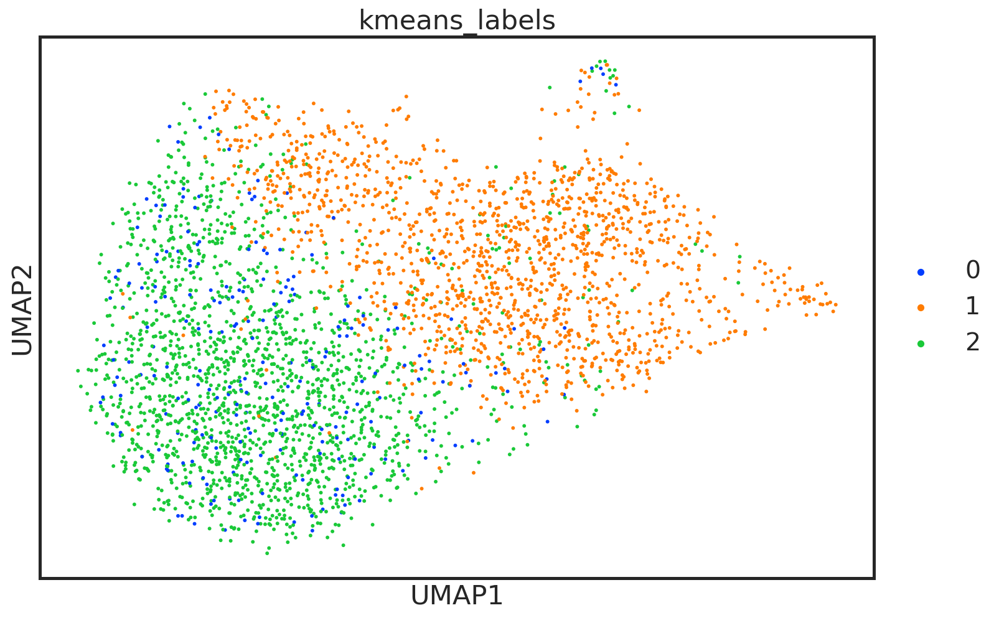

In [179]:
adata.obs['kmeans_labels'] = df_p_hat['kmeans'].values.astype('str')
sc.pl.umap(adata, color='kmeans_labels')

In [180]:
plt.scatter(tmp[batch==1], tmp[batch==1], c=kmeans.labels_==1, alpha=0.5)
# i want a two by two table, with perturbed/nnot perturbed, and kmeans label 0 and 1

IndexError: boolean index did not match indexed array along dimension 0; dimension is 2054 but corresponding boolean dimension is 3455

In [181]:
plt.scatter(tmp[batch==1], tmp[batch==1], c=perturbed[batch==1]=='Memory B', alpha=0.5)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 2054 but corresponding boolean dimension is 3455